# Entry 34a notebook - Regression datasets

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import openml

## openml datasets

In [2]:
openml_opts = openml.datasets.list_datasets(output_format='dataframe')
# openml_opts[openml_opts['name'].str.startswith('T')].sort_values('name')
openml_opts.head()

,did,name,version,uploader,status,format,MajorityClassSize,MaxNominalAttDistinctValues,MinorityClassSize,NumberOfClasses,NumberOfFeatures,NumberOfInstances,NumberOfInstancesWithMissingValues,NumberOfMissingValues,NumberOfNumericFeatures,NumberOfSymbolicFeatures
2,2,anneal,1,1,active,ARFF,684.0,7.0,8.0,5.0,39.0,898.0,898.0,22175.0,6.0,33.0
3,3,kr-vs-kp,1,1,active,ARFF,1669.0,3.0,1527.0,2.0,37.0,3196.0,0.0,0.0,0.0,37.0
4,4,labor,1,1,active,ARFF,37.0,3.0,20.0,2.0,17.0,57.0,56.0,326.0,8.0,9.0
5,5,arrhythmia,1,1,active,ARFF,245.0,13.0,2.0,13.0,280.0,452.0,384.0,408.0,206.0,74.0
6,6,letter,1,1,active,ARFF,813.0,26.0,734.0,26.0,17.0,20000.0,0.0,0.0,16.0,1.0


In [51]:
pd.set_option('display.max_rows', 270)
openml_opts[(openml_opts['NumberOfClasses'] == 0) & (openml_opts['NumberOfFeatures'] < 50) & ~(openml_opts['name'].str.startswith('BNG')) & ~(openml_opts['name'].str.startswith('fri_'))].sort_values('name')
# BNG = Bayesian Network Generated => artificially generated datasets
# analcatdata = collection of datasets used in the book "Analyzing Categorical Data" by Jeffrey Simonoff
# chscase = collection of datasets used in the book "A Casebook for a First Course in Statistics and Data Analysis" by Samprit Chatterjee, Mark S. Handcock and Jeffrey S. Simonoff,
# fri_ = artificially generated datasets originating from: J.H. Friedman (1999). "Stochastic Gradient Boosting"
# rabe_ = collection of datasets used in the book Regression Analysis By Example, 2nd Edition, by Samprit Chatterjee and Bertram Price

,did,name,version,uploader,status,format,MajorityClassSize,MaxNominalAttDistinctValues,MinorityClassSize,NumberOfClasses,NumberOfFeatures,NumberOfInstances,NumberOfInstancesWithMissingValues,NumberOfMissingValues,NumberOfNumericFeatures,NumberOfSymbolicFeatures
215,215,2dplanes,1,1,active,ARFF,NaN,NaN,NaN,0.0,11.0,40768.0,0.0,0.0,11.0,0.0
1094,1094,Acorns,1,2,active,ARFF,NaN,2.0,NaN,0.0,5.0,39.0,0.0,0.0,3.0,2.0
296,296,Ailerons,1,167,active,ARFF,NaN,NaN,NaN,0.0,41.0,13750.0,0.0,0.0,41.0,0.0
1093,1093,Brainsize,1,2,active,ARFF,NaN,2.0,NaN,0.0,7.0,40.0,2.0,3.0,6.0,1.0
5648,5648,COMET_MC,2,753,active,ARFF,NaN,NaN,NaN,0.0,6.0,7619400.0,0.0,0.0,6.0,0.0
5587,5587,COMET_MC,1,753,active,ARFF,NaN,NaN,NaN,0.0,6.0,7619400.0,0.0,0.0,6.0,0.0
5889,5889,COMET_MC,3,753,active,ARFF,NaN,NaN,NaN,0.0,6.0,7619400.0,0.0,0.0,6.0,0.0
23395,23395,COMET_MC_SAMPLE,2,753,active,ARFF,NaN,NaN,NaN,0.0,6.0,89640.0,0.0,0.0,6.0,0.0
23397,23397,COMET_MC_SAMPLE,4,753,active,ARFF,NaN,NaN,NaN,0.0,6.0,761940.0,0.0,0.0,6.0,0.0
41700,41700,CPMP-2015-regression,1,8316,active,ARFF,NaN,4.0,NaN,0.0,27.0,2108.0,0.0,0.0,24.0,2.0


In [131]:
bangladesh_rain = openml.datasets.get_dataset(41539).get_data()[0]
bangladesh_rain.head()

,Year,Station,Month,Rainfall
0,1970.0,Barisal,January,0.0
1,1970.0,Barisal,February,24.0
2,1970.0,Barisal,March,5.0
3,1970.0,Barisal,April,91.0
4,1970.0,Barisal,May,124.0


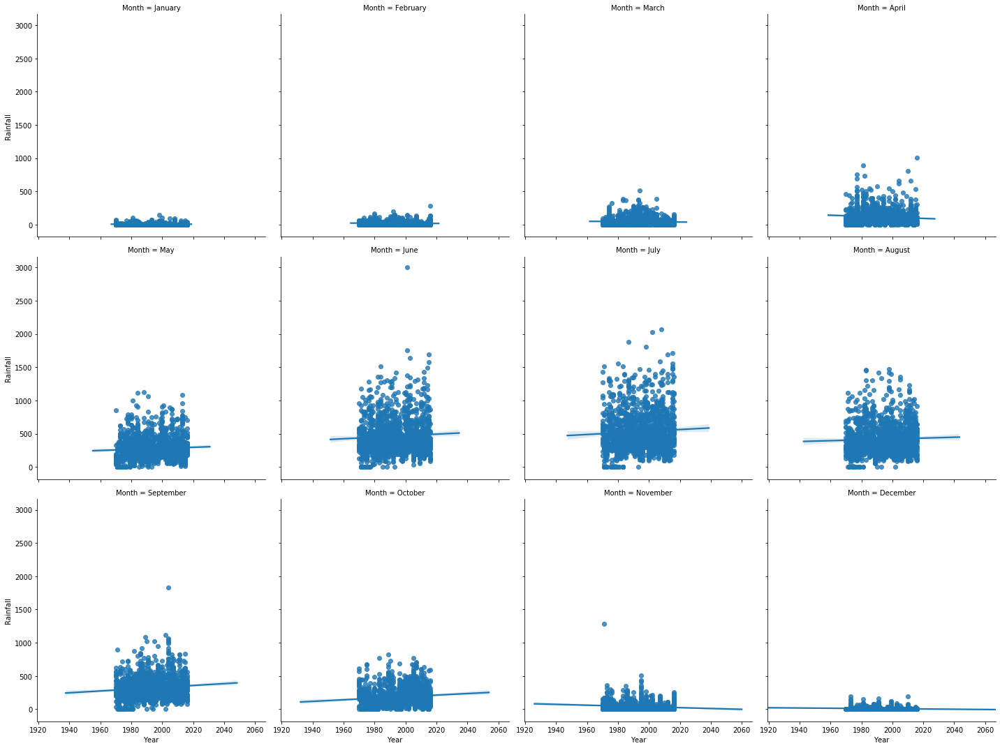

In [138]:
month_cat_type = pd.api.types.CategoricalDtype(categories = list(bangladesh_rain['Month'].unique()), ordered=True)
bangladesh_rain['Month'] = bangladesh_rain['Month'].astype(month_cat_type)
sns.lmplot(x='Year', y='Rainfall', data=bangladesh_rain, col='Month', col_wrap=4)

In [161]:
rabe_266 = openml.datasets.get_dataset(663).get_data()[0]
rabe_266.head()

,col_1,col_2,col_3
0,50,5,48
1,40,5,36
2,30,5,27
3,20,5,17
4,10,5,5


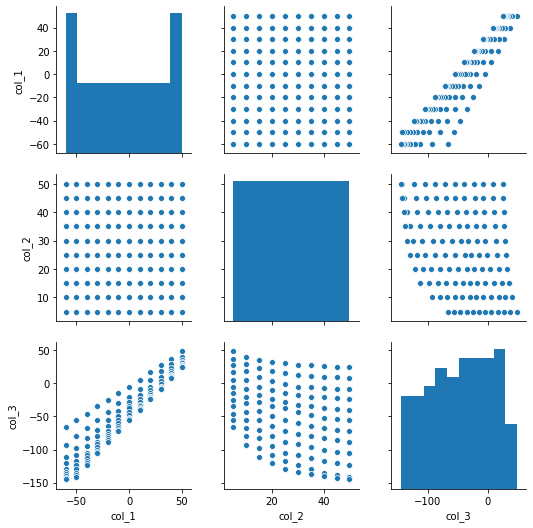

In [162]:
sns.pairplot(rabe_266)

In [159]:
rabe_265 = openml.datasets.get_dataset(660).get_data()[0]
rabe_265.head()

,col_1,col_2,col_3,col_4,col_5,col_6,col_7
0,27.0,41.3,2948.0,26.2,51.7,42.7,89.8
1,22.9,66.7,4644.0,3.0,45.7,41.8,121.3
2,26.3,58.1,3665.0,3.0,50.8,38.5,115.2
3,29.1,39.9,2878.0,18.3,51.5,38.8,100.3
4,28.1,62.6,4493.0,7.0,50.8,39.7,123.0


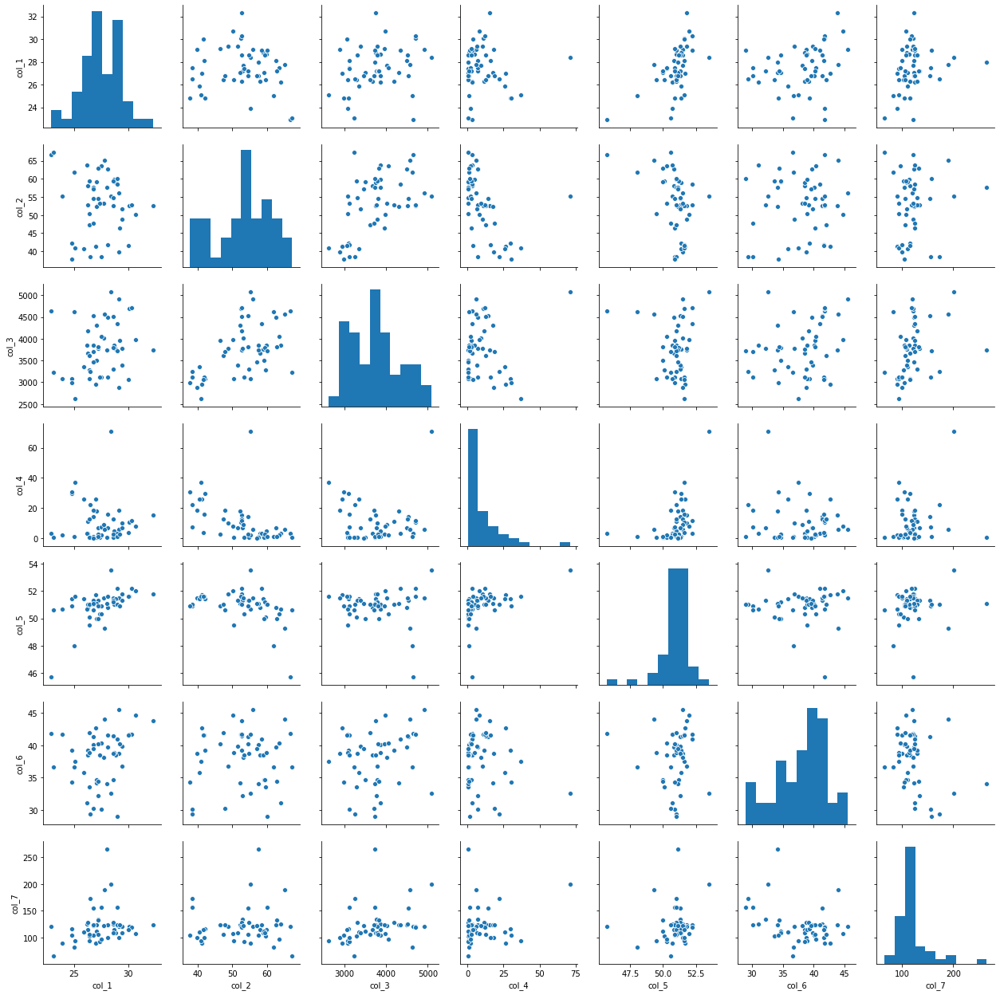

In [160]:
sns.pairplot(rabe_265)

In [157]:
rabe_176 = openml.datasets.get_dataset(698).get_data()[0]
rabe_176.head()

,col_2,col_3,col_4,col_5
0,0.60814,0.03509,0.16607,-0.43148
1,0.79369,0.47924,0.53356,0.79969
2,-0.82630,-0.61951,-0.78635,-0.92467
3,-1.25310,-1.21675,-1.04076,-2.19081
4,0.17399,-0.18517,0.14229,-2.84818


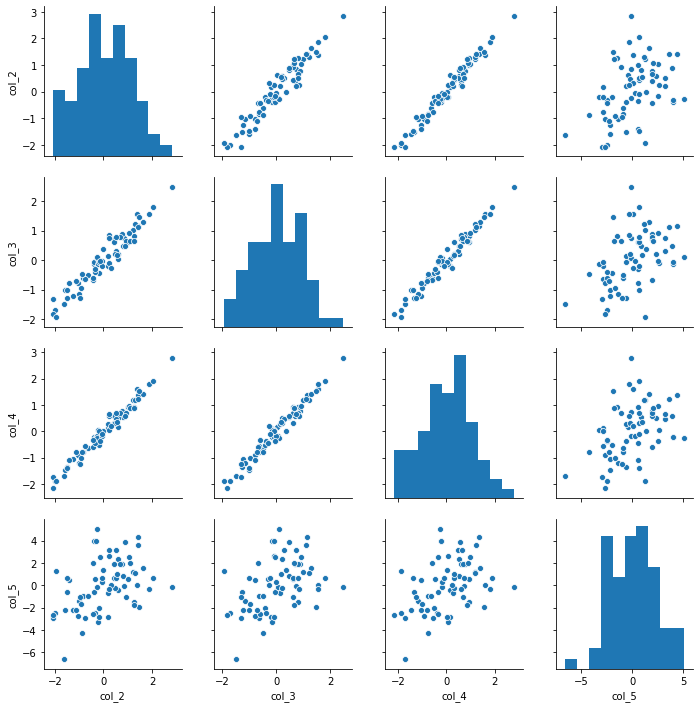

In [158]:
sns.pairplot(rabe_176)

In [110]:
rabe_166 = openml.datasets.get_dataset(684).get_data()[0]
rabe_166.head()

,col_2,col_3
0,37.0,109
1,33.5,115
2,30.8,113
3,37.9,116
4,37.4,118


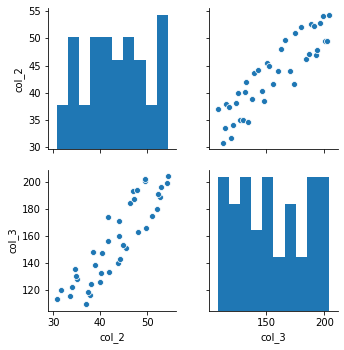

In [111]:
sns.pairplot(rabe_166)

In [147]:
rabe_148 = openml.datasets.get_dataset(710).get_data()[0]
rabe_148.head()

,col_1,col_2,col_3,col_4,col_5,col_6
0,36.7,-62.8,-89.5,54.1,1.7,0.0
1,24.0,3.3,-3.5,20.9,1.1,0.0
2,-61.6,-120.8,-103.2,24.7,2.5,0.0
3,-1.0,-18.1,-28.8,36.2,1.1,0.0
4,18.9,-3.8,-50.6,26.4,0.9,0.0


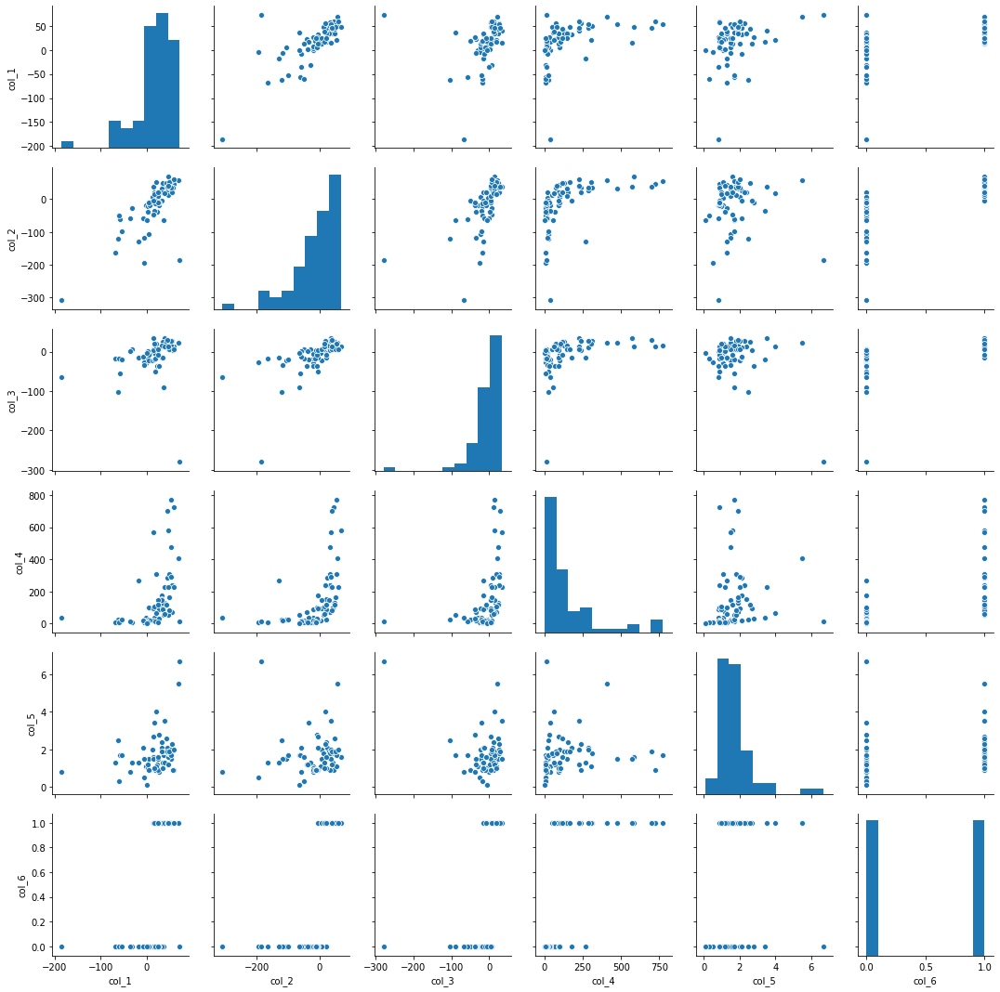

In [148]:
sns.pairplot(rabe_148)

In [155]:
rabe_131 = openml.datasets.get_dataset(692).get_data()[0]
rabe_131.head()

,col_1,col_2,col_3,col_4,col_5,col_6
0,1,508,235,3944,325,1
1,2,564,231,4578,323,1
2,3,322,270,4011,328,1
3,4,846,261,5233,305,1
4,5,871,300,4780,303,1


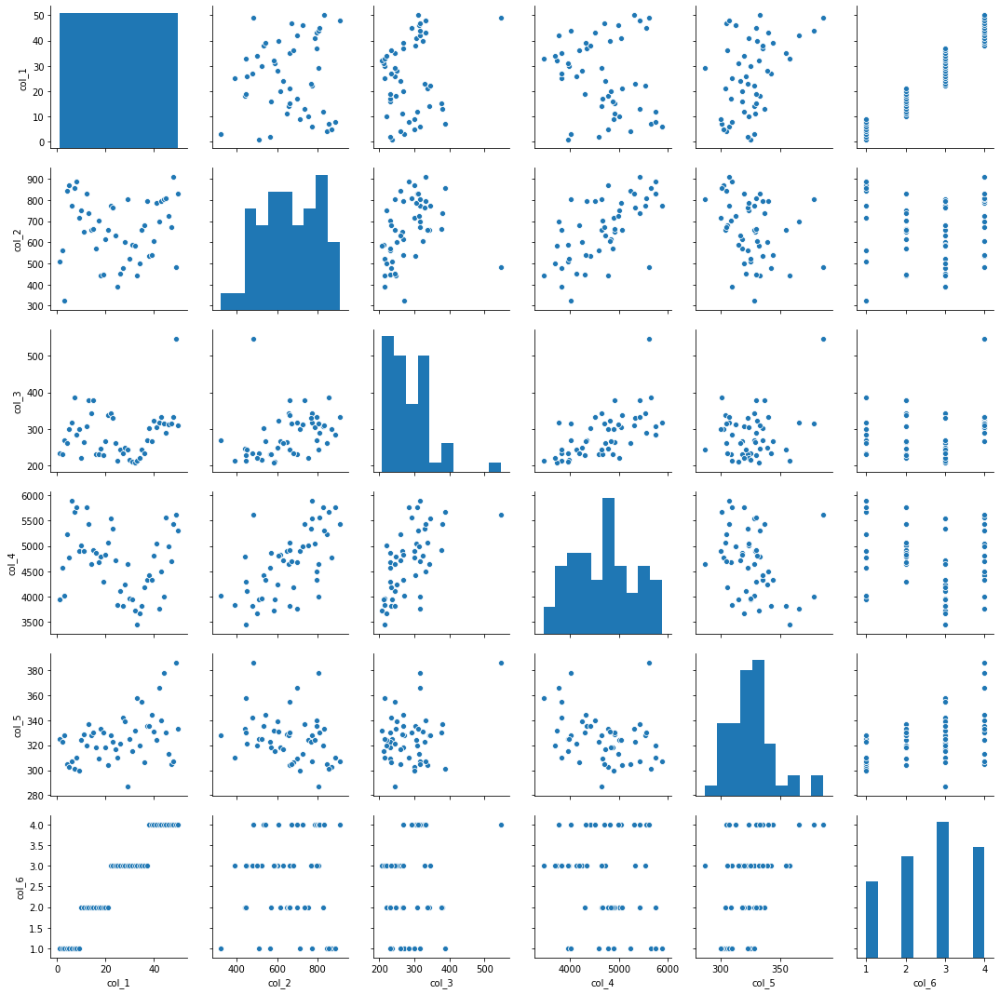

In [156]:
sns.pairplot(rabe_131)

In [153]:
wine_quality = openml.datasets.get_dataset(287).get_data()[0]
wine_quality.head()

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0


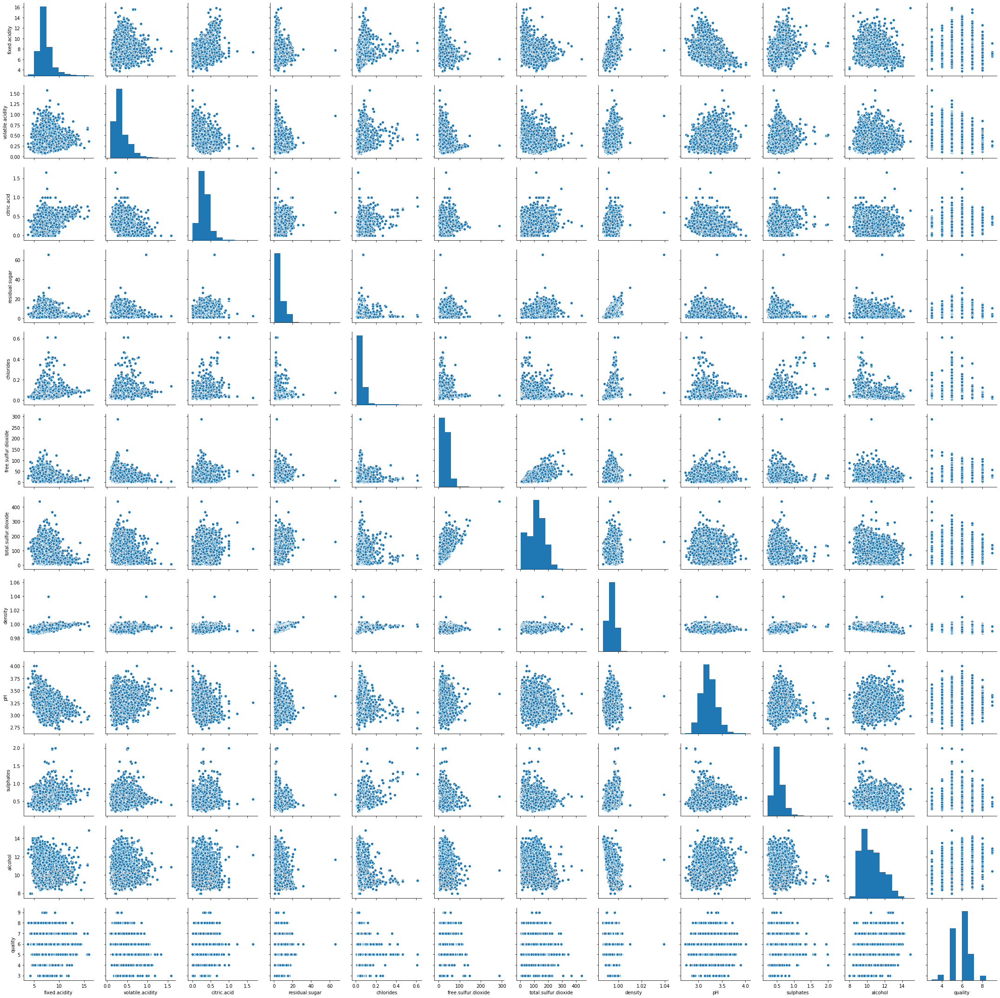

In [154]:
sns.pairplot(wine_quality)

In [149]:
house_sales = openml.datasets.get_dataset(42092).get_data()[0]
house_sales.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


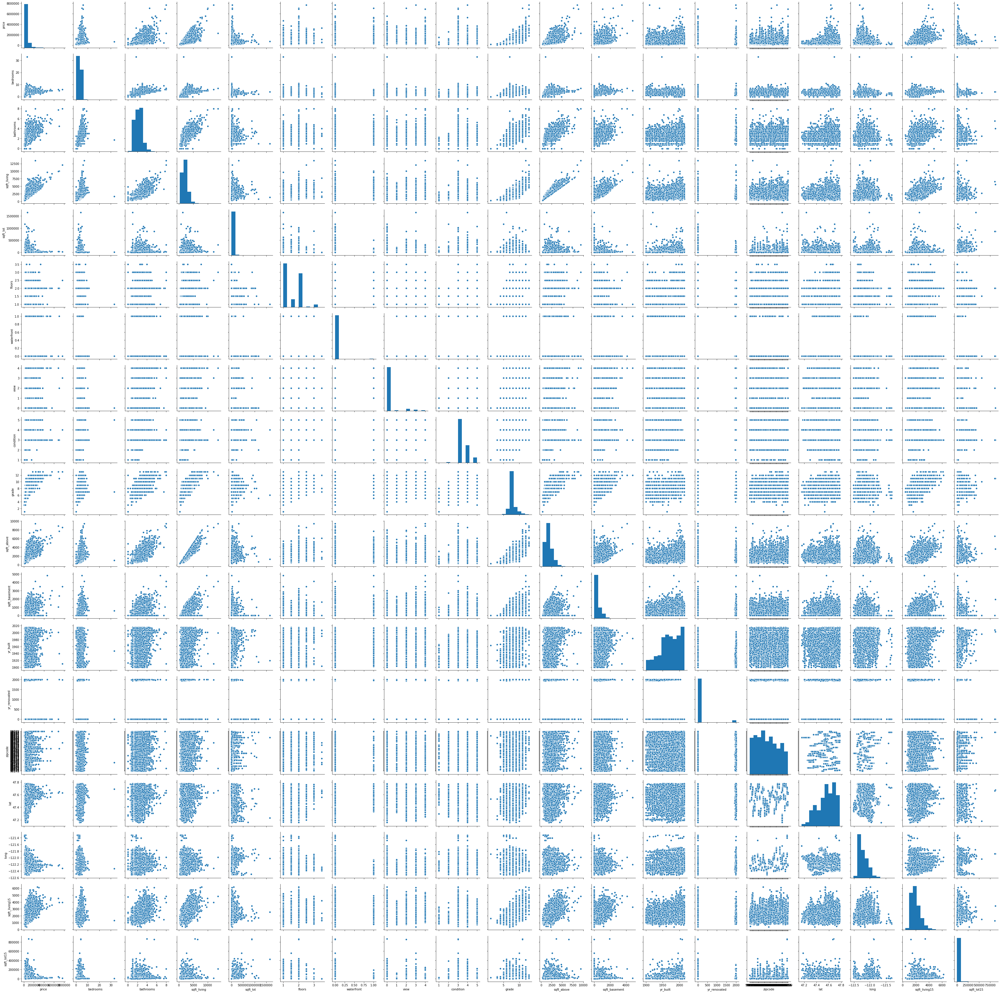

In [150]:
sns.pairplot(house_sales)

In [151]:
house_16H = openml.datasets.get_dataset(574).get_data()[0]
house_16H.head()

,P1,P5p1,P6p2,P11p4,P14p9,P15p1,P15p3,P16p2,P18p2,P27p4,H2p2,H8p2,H10p1,H13p1,H18pA,H40p4,price
0,15512.0,0.460869,0.049252,0.226470,0.149827,0.752837,0.010057,0.579729,0.003251,0.075912,0.625318,0.036613,0.991377,0.260116,0.052246,0.774059,130600.0
1,1550.0,0.470968,0.002581,0.137419,0.096341,0.862581,0.000000,0.695142,0.005025,0.043551,0.064263,0.003350,0.994975,0.285266,0.060606,0.142857,40500.0
2,4741.0,0.485341,0.000211,0.189412,0.135656,0.856992,0.000000,0.683584,0.004143,0.027965,0.065796,0.000000,0.997411,0.315433,0.065116,0.687500,28700.0
3,467.0,0.498929,0.000000,0.100642,0.085470,0.907923,0.000000,0.780488,0.006098,0.018293,0.057471,0.000000,1.000000,0.149425,0.139535,1.000000,28500.0
4,310.0,0.474193,0.680645,0.225806,0.128834,0.896774,0.000000,0.756302,0.008403,0.016807,0.077519,0.672269,0.991597,0.147287,0.000000,0.000000,24100.0


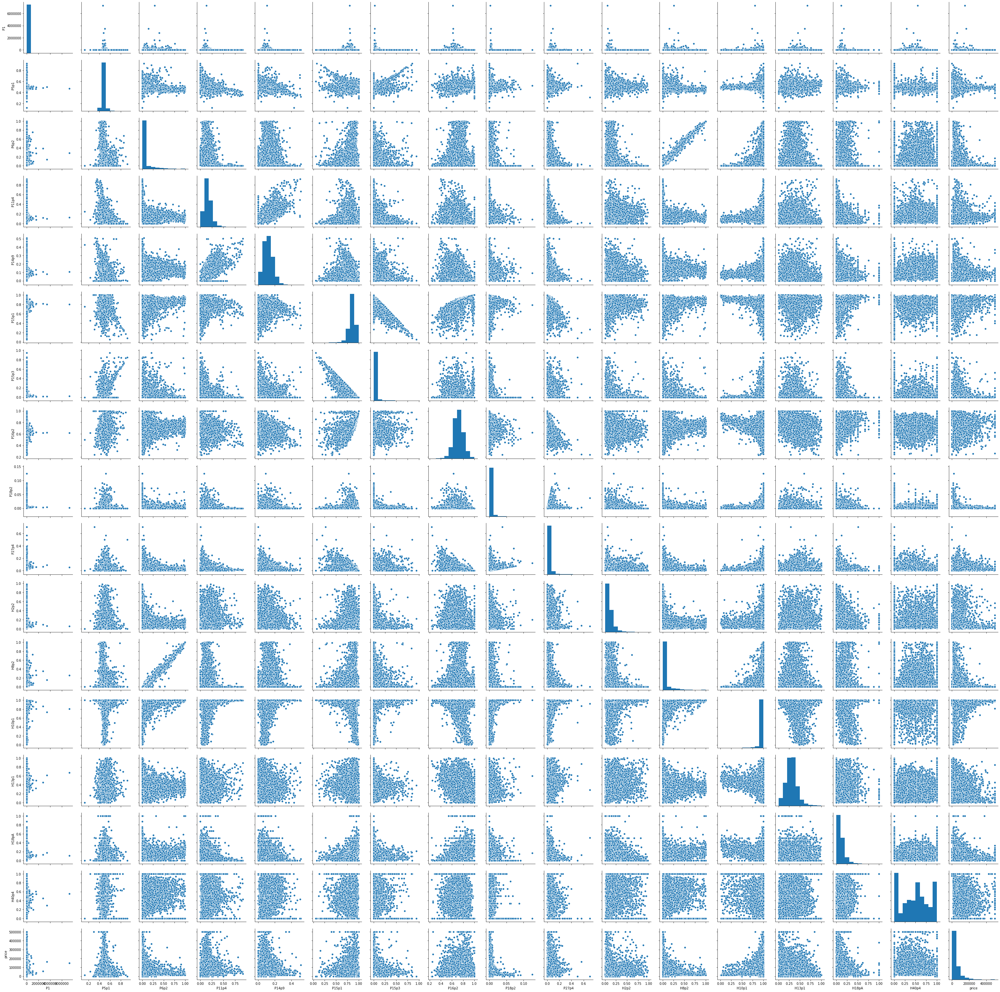

In [152]:
sns.pairplot(house_16H)

In [38]:
cholesterol = openml.datasets.get_dataset(207).get_data()[0]
cholesterol.head()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,class
0,2.0,164.0,99.8,176.6,66.2,54.3,2337.0,109.0,3.19,3.4,10.0,102.0,5500.0,24.0,30.0,13950.0
1,2.0,164.0,99.4,176.6,66.4,54.3,2824.0,136.0,3.19,3.4,8.0,115.0,5500.0,18.0,22.0,17450.0
2,1.0,158.0,105.8,192.7,71.4,55.7,2844.0,136.0,3.19,3.4,8.5,110.0,5500.0,19.0,25.0,17710.0
3,1.0,158.0,105.8,192.7,71.4,55.9,3086.0,131.0,3.13,3.4,8.3,140.0,5500.0,17.0,20.0,23875.0
4,2.0,192.0,101.2,176.8,64.8,54.3,2395.0,108.0,3.50,2.8,8.8,101.0,5800.0,23.0,29.0,16430.0


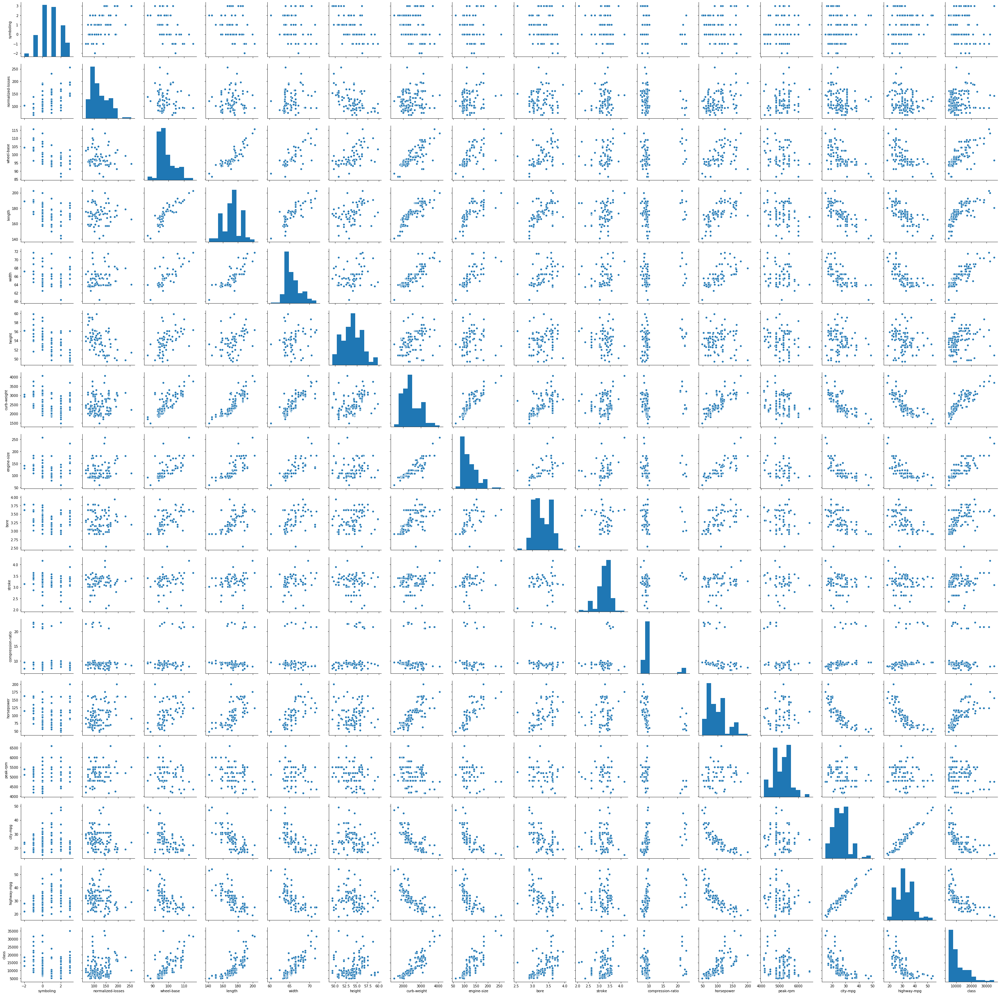

In [144]:
sns.pairplot(cholesterol)

In [31]:
auto_price = openml.datasets.get_dataset(207).get_data()[0]
auto_price.head()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,class
0,2.0,164.0,99.8,176.6,66.2,54.3,2337.0,109.0,3.19,3.4,10.0,102.0,5500.0,24.0,30.0,13950.0
1,2.0,164.0,99.4,176.6,66.4,54.3,2824.0,136.0,3.19,3.4,8.0,115.0,5500.0,18.0,22.0,17450.0
2,1.0,158.0,105.8,192.7,71.4,55.7,2844.0,136.0,3.19,3.4,8.5,110.0,5500.0,19.0,25.0,17710.0
3,1.0,158.0,105.8,192.7,71.4,55.9,3086.0,131.0,3.13,3.4,8.3,140.0,5500.0,17.0,20.0,23875.0
4,2.0,192.0,101.2,176.8,64.8,54.3,2395.0,108.0,3.50,2.8,8.8,101.0,5800.0,23.0,29.0,16430.0


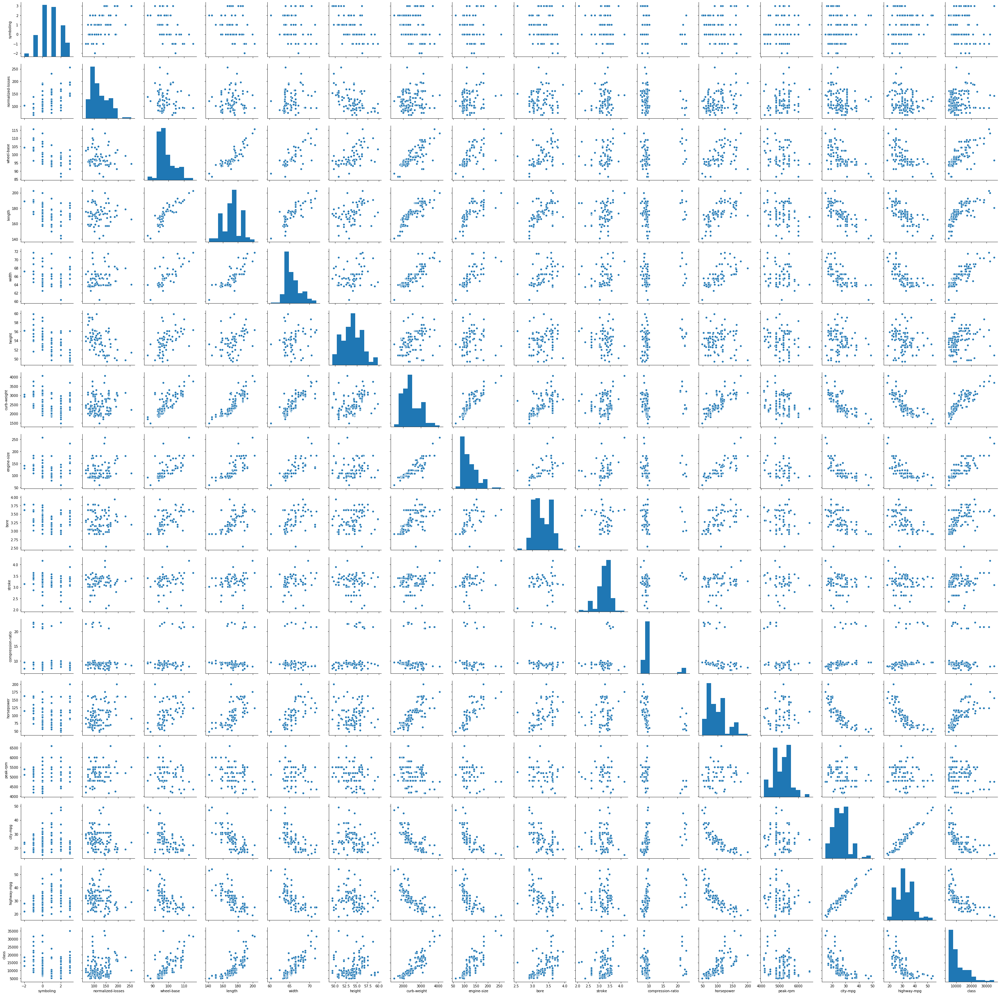

In [143]:
sns.pairplot(auto_price)

In [28]:
auto_mpg = openml.datasets.get_dataset(42372).get_data()[0]
auto_mpg.head()

,Displacement,Horse_power,Weight,Acceleration,Model_year,Mpg
0,91.0,70.0,1955.0,20.5,71.0,26.0
1,232.0,100.0,2789.0,15.0,73.0,18.0
2,350.0,145.0,4055.0,12.0,76.0,13.0
3,318.0,140.0,4080.0,13.7,78.0,17.5
4,113.0,95.0,2372.0,15.0,70.0,24.0


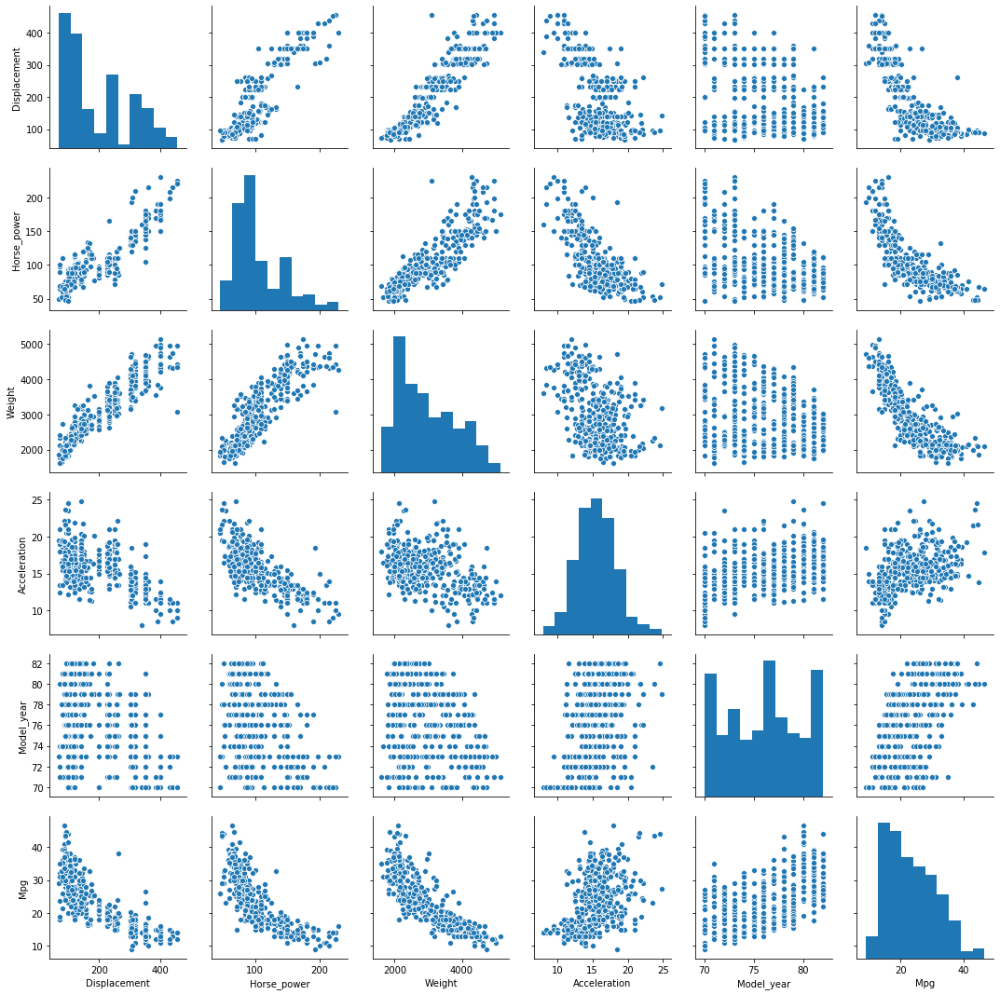

In [142]:
sns.pairplot(auto_mpg)

In [29]:
auto_93 = openml.datasets.get_dataset(569).get_data()[0]
auto_93.head()

,Manufacturer,Type,City_MPG,Highway_MPG,Air_Bags_standard,Drive_train_type,Number_of_cylinders,Engine_size,Horsepower,RPM,...,Passenger_capacity,Length,Wheelbase,Width,U-turn_space,Rear_seat_room,Luggage_capacity,Weight,Domestic,class
0,Acura,Small,25.0,31.0,0,1,4.0,1.8,140.0,6300.0,...,5.0,177.0,102.0,68.0,37.0,26.5,11.0,2705.0,0,15.9
1,Acura,Midsize,18.0,25.0,2,1,6.0,3.2,200.0,5500.0,...,5.0,195.0,115.0,71.0,38.0,30.0,15.0,3560.0,0,33.9
2,Audi,Compact,20.0,26.0,1,1,6.0,2.8,172.0,5500.0,...,5.0,180.0,102.0,67.0,37.0,28.0,14.0,3375.0,0,29.1
3,Audi,Midsize,19.0,26.0,2,1,6.0,2.8,172.0,5500.0,...,6.0,193.0,106.0,70.0,37.0,31.0,17.0,3405.0,0,37.7
4,BMW,Midsize,22.0,30.0,1,0,4.0,3.5,208.0,5700.0,...,4.0,186.0,109.0,69.0,39.0,27.0,13.0,3640.0,0,30.0


//anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
//anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


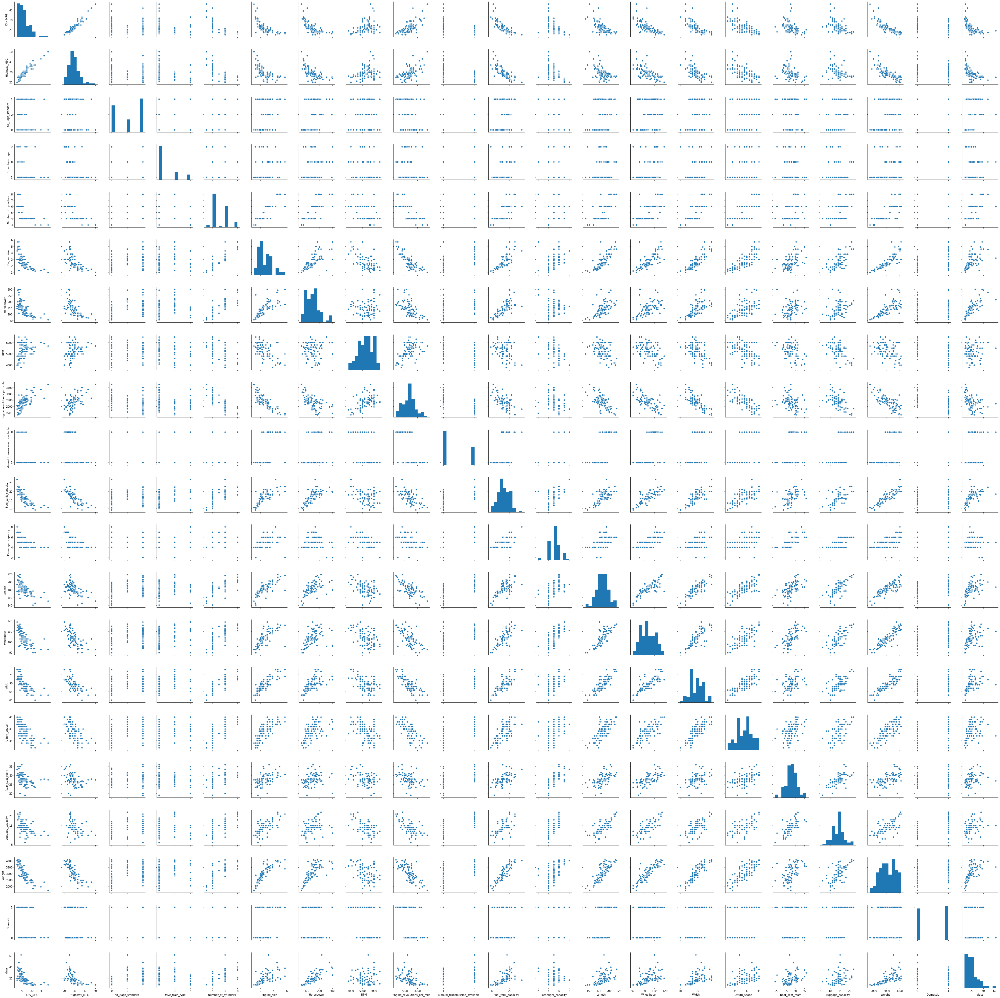

In [141]:
sns.pairplot(auto_93)

## Planets and moons datasets

In [72]:
planets = pd.read_excel('../data/planets_moons.xlsx')
p_cols = ['name', 'mass_1024kg', 'diameter_km','mean_radius_km', 'density_kg_m3', 'gravity_m_s2', 'escape_vel_km_s']
planets = planets[p_cols]
planets.head()

,name,mass_1024kg,diameter_km,mean_radius_km,density_kg_m3,gravity_m_s2,escape_vel_km_s
0,Mercury,0.330,4879.0,2439.4000,5427,3.7,4.3
1,Venus,4.870,12104.0,6051.8000,5243,8.9,10.4
2,Earth,5.970,12756.0,6371.0084,5514,9.8,11.2
3,Moon,0.073,3475.0,1737.4000,3340,1.6,2.4
4,Mars,0.642,6792.0,3389.5000,3933,3.7,5.0


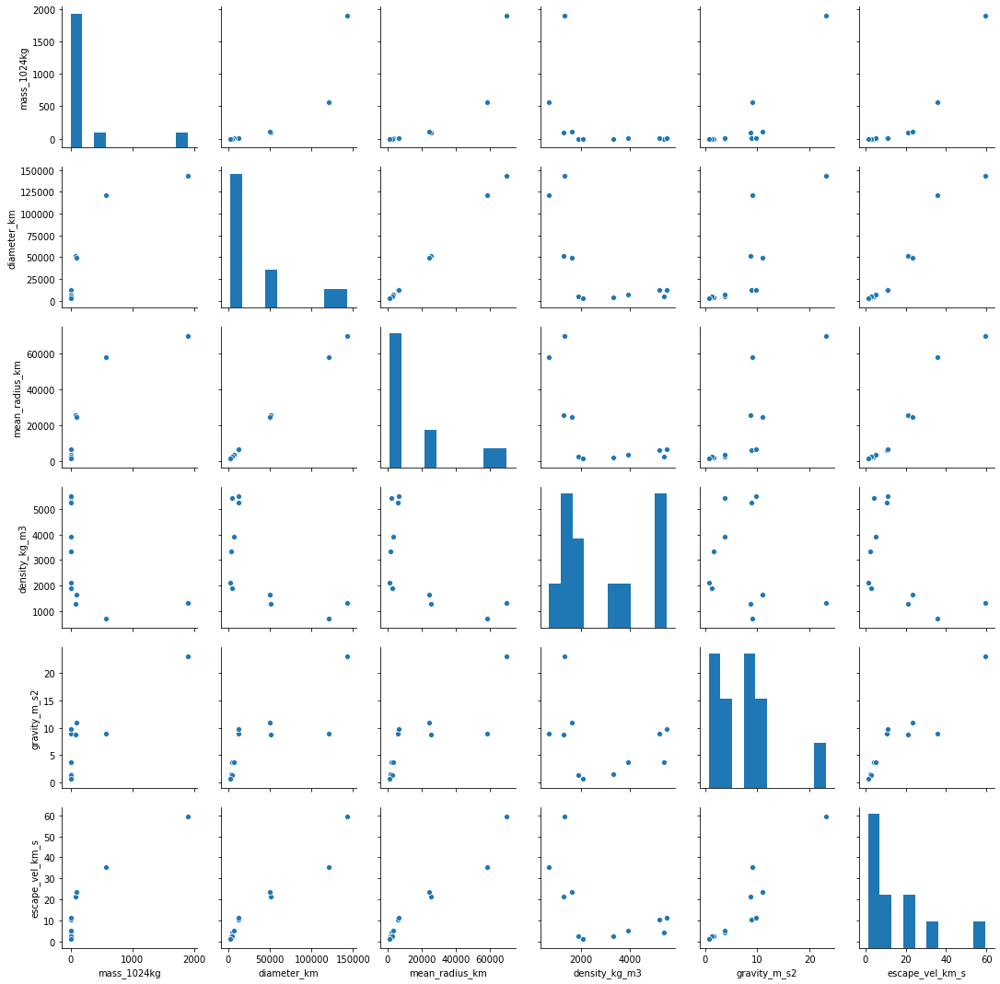

In [73]:
sns.pairplot(planets)

In [88]:
moons = pd.read_excel('../data/planets_moons.xlsx', sheet_name='moons')
m_cols = ['name', 'GM_km3_sec2', 'mean_radius_km', 'mean_density_g_cm3']
moons = moons[m_cols]
moons['GM_km3_sec2'] = moons['GM_km3_sec2'].str.split('±', n=1, expand=True)[0].astype('float32')
moons['mean_radius_km'] = moons['mean_radius_km'].str.split('±', n=1, expand=True)[0].astype('float32')
moons['mean_density_g_cm3'] = moons['mean_density_g_cm3'].str.split('±', n=1, expand=True)[0].astype('float32')
moons.head()

,name,GM_km3_sec2,mean_radius_km,mean_density_g_cm3
0,Moon,4902.800781,1737.500000,3.344
1,Phobos,0.000711,11.100000,1.872
2,Deimos,0.000099,6.200000,1.471
3,Io,5959.916016,1821.599976,3.528
4,Europa,3202.739014,1560.800049,3.013


//anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
//anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


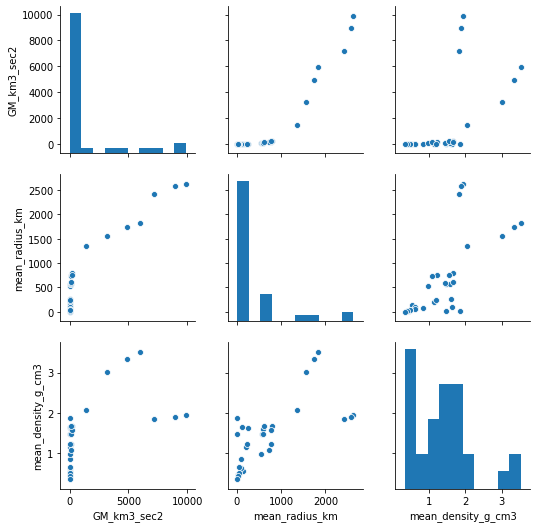

In [89]:
sns.pairplot(moons)

## Seaborn datasets

In [4]:
sns.get_dataset_names()

['anscombe',
 'attention',
 'brain_networks',
 'car_crashes',
 'diamonds',
 'dots',
 'exercise',
 'flights',
 'fmri',
 'gammas',
 'iris',
 'mpg',
 'planets',
 'tips',
 'titanic']

## Anscombe

In [8]:
anscombe = sns.load_dataset('anscombe')
anscombe.head()

,dataset,x,y
0,I,10.0,8.04
1,I,8.0,6.95
2,I,13.0,7.58
3,I,9.0,8.81
4,I,11.0,8.33


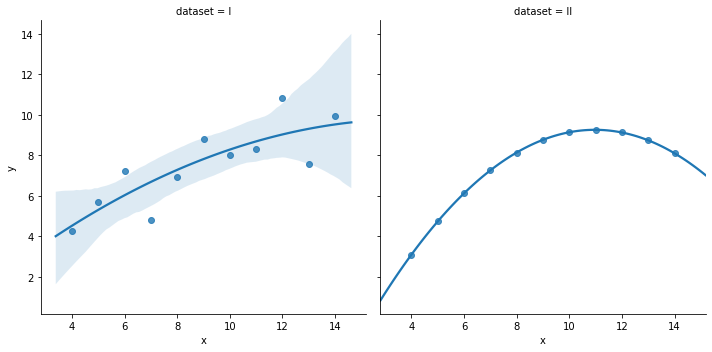

In [16]:
sns.lmplot(x="x", y="y", data=anscombe[(anscombe['dataset'] == 'I') | (anscombe['dataset'] == 'II')], order=2, col="dataset")

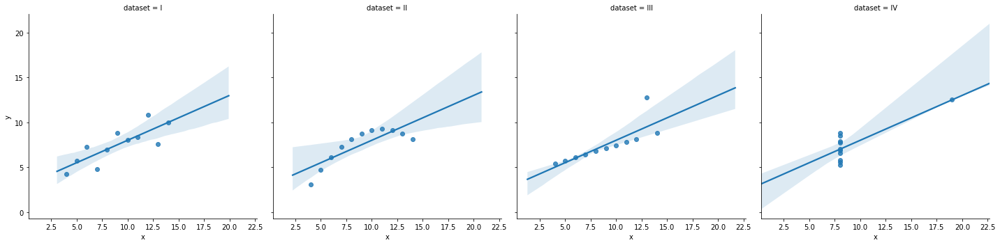

In [18]:
sns.lmplot(x="x", y="y", data=anscombe, col="dataset")

## Attention

In [20]:
attention = sns.load_dataset('attention')
attention.head()

,Unnamed: 0,subject,attention,solutions,score
0,0,1,divided,1,2.0
1,1,2,divided,1,3.0
2,2,3,divided,1,3.0
3,3,4,divided,1,5.0
4,4,5,divided,1,4.0


//anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the swarmplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


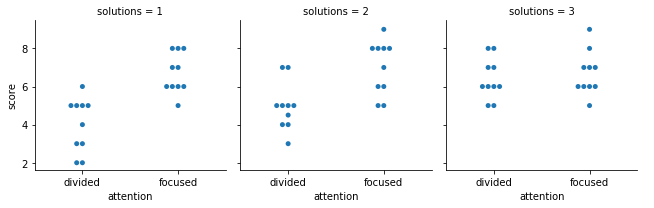

In [27]:
att = sns.FacetGrid(attention, col="solutions")
att.map(sns.swarmplot, "attention", "score")
att.add_legend()

## Car crashes

In [30]:
crash = sns.load_dataset("car_crashes")
crash.head()

,total,speeding,alcohol,not_distracted,no_previous,ins_premium,ins_losses,abbrev
0,18.8,7.332,5.640,18.048,15.040,784.55,145.08,AL
1,18.1,7.421,4.525,16.290,17.014,1053.48,133.93,AK
2,18.6,6.510,5.208,15.624,17.856,899.47,110.35,AZ
3,22.4,4.032,5.824,21.056,21.280,827.34,142.39,AR
4,12.0,4.200,3.360,10.920,10.680,878.41,165.63,CA


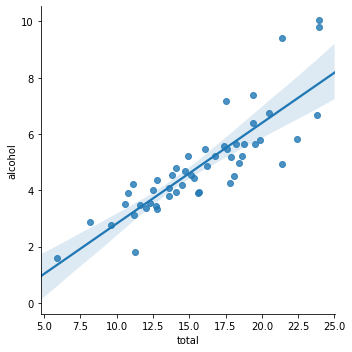

In [33]:
sns.lmplot(x="total", y="alcohol", data=crash)

## Diamonds

In [47]:
dia = sns.load_dataset('diamonds')
dia.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


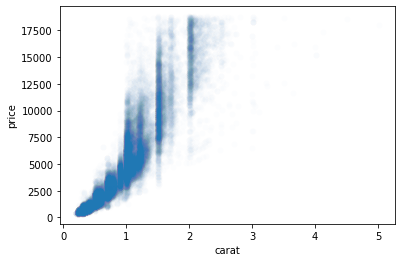

In [66]:
sns.scatterplot(x="carat", y="price", data=dia, alpha=0.01)

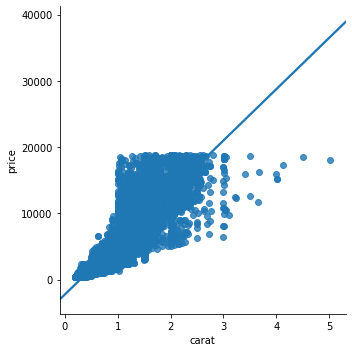

In [65]:
sns.lmplot(x="carat", y="price", data=dia)

### Exercise

In [80]:
exercise = sns.load_dataset('exercise')
exercise.head()

,Unnamed: 0,id,diet,pulse,time,kind
0,0,1,low fat,85,1 min,rest
1,1,1,low fat,85,15 min,rest
2,2,1,low fat,88,30 min,rest
3,3,2,low fat,90,1 min,rest
4,4,2,low fat,92,15 min,rest


In [82]:
exercise['diet'].unique()

[low fat, no fat]
Categories (2, object): [low fat, no fat]

In [83]:
exercise[exercise['id'] == 1]

,Unnamed: 0,id,diet,pulse,time,kind
0,0,1,low fat,85,1 min,rest
1,1,1,low fat,85,15 min,rest
2,2,1,low fat,88,30 min,rest


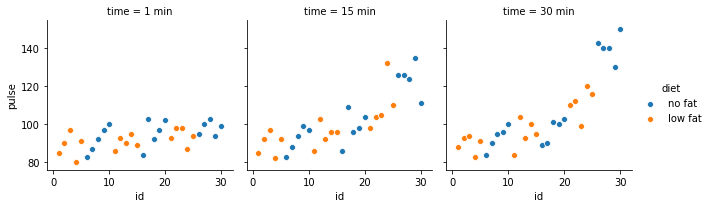

In [86]:
execer = sns.FacetGrid(exercise, col="time", hue="diet")
execer.map(sns.scatterplot, "id", "pulse")
execer.add_legend()

## Flights

In [87]:
flights = sns.load_dataset('flights')
flights.head()

,year,month,passengers
0,1949,January,112
1,1949,February,118
2,1949,March,132
3,1949,April,129
4,1949,May,121


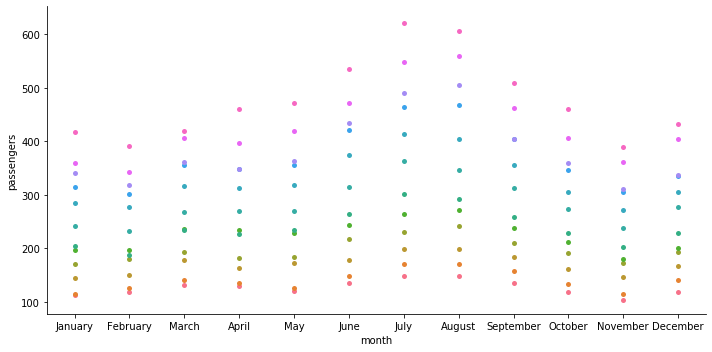

In [96]:
fly = sns.FacetGrid(flights, hue="year", height=5, aspect = 2)
fly.map(sns.swarmplot, "month", "passengers")

## MPG

In [114]:
mpg = sns.load_dataset('mpg')
mpg.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


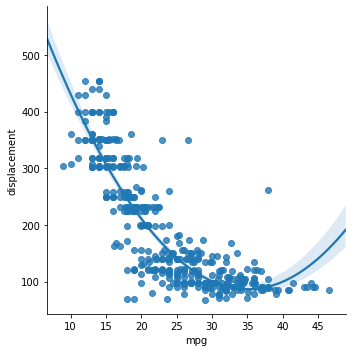

In [117]:
sns.lmplot(x="mpg", y="displacement", data=mpg, order=2)

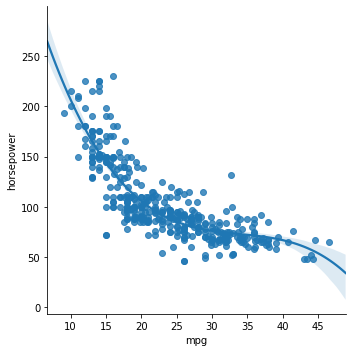

In [140]:
sns.lmplot(x="mpg", y="horsepower", data=mpg, order=3)

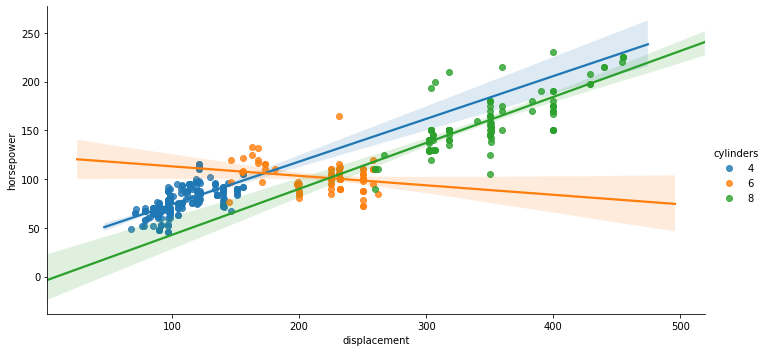

In [139]:
sns.lmplot(x="displacement", y="horsepower", data=mpg[(mpg['cylinders']==4) | (mpg['cylinders']==6) | (mpg['cylinders']==8)], hue='cylinders', height=5, aspect=2)

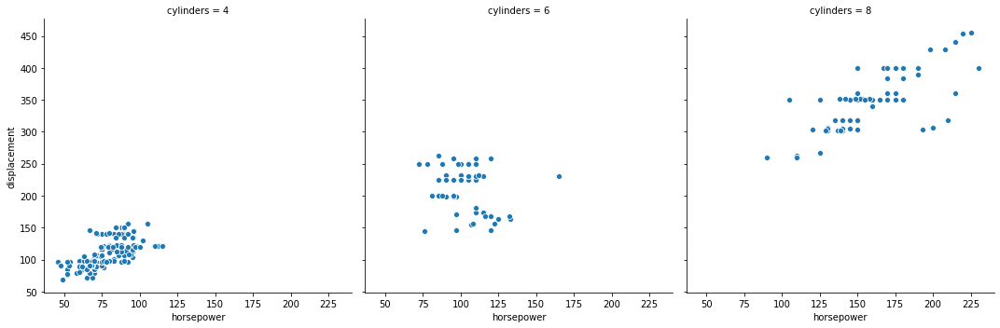

In [138]:
mpg_cyl = sns.FacetGrid(mpg[(mpg['cylinders']==4) | (mpg['cylinders']==6) | (mpg['cylinders']==8)], col='cylinders', height=5)
mpg_cyl.map(sns.scatterplot, "horsepower", "displacement")

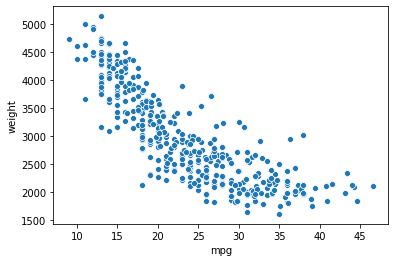

In [142]:
sns.scatterplot(x="mpg", y="weight", data=mpg)

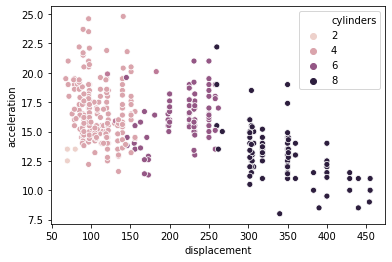

In [154]:
sns.scatterplot(x="displacement", y="acceleration", data=mpg, hue="cylinders")

## Tips

In [169]:
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


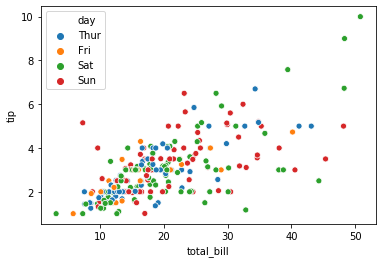

In [177]:
sns.scatterplot(x="total_bill", y="tip", data=tips, hue="day")

## Sklearn datasets

In [90]:
from sklearn.datasets import load_boston
from sklearn.datasets import fetch_california_housing

In [99]:
boston_x = pd.DataFrame(load_boston()['data'], columns = load_boston()['feature_names'])
boston_y = load_boston()['target']

boston_x.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


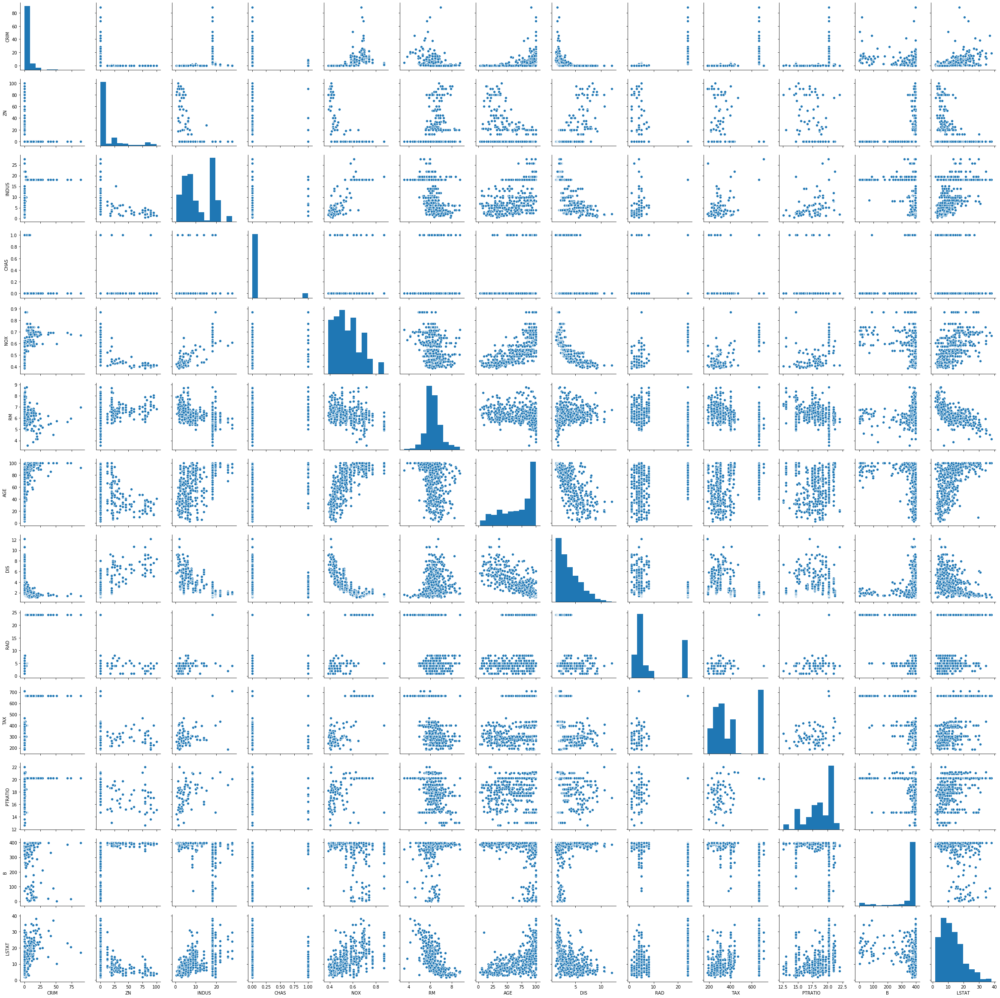

In [139]:
sns.pairplot(boston_x)

In [104]:
ca_housing_x = pd.DataFrame(fetch_california_housing()['data'], columns=fetch_california_housing()['feature_names'])
ca_housing_y = fetch_california_housing()['target']

ca_housing_x.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


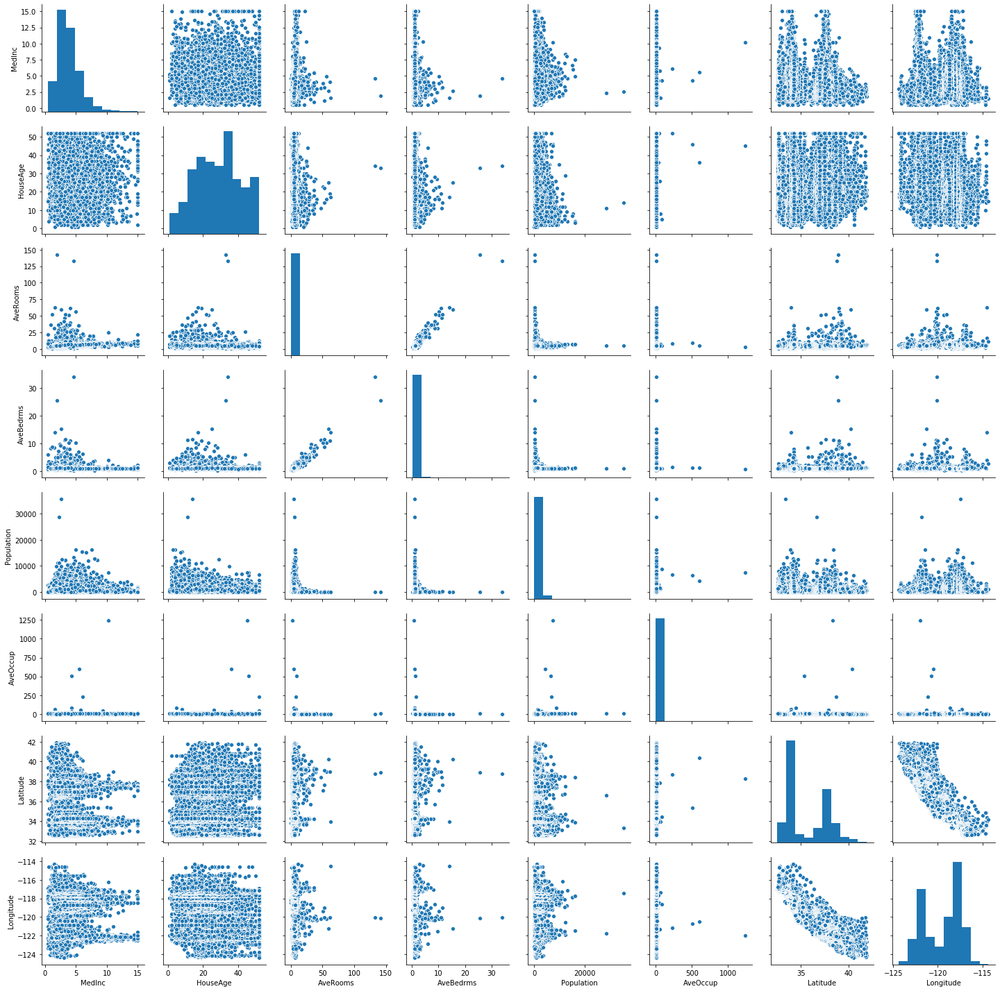

In [140]:
sns.pairplot(ca_housing_x)